<a href="https://colab.research.google.com/github/Kennydtai/Image_based_geolocation/blob/main/MRP_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git --version

git version 2.34.1


In [ ]:
!git config --global user.email "kennydtai@gmail.com"
!git config --global user.name "Kenny Durojaiye"

In [ ]:
repo_url = "https://github.com/Kennydtai/Image_based_geolocation.git"
!git clone $repo_url

Cloning into 'Image_based_geolocation'...
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 7 (delta 1), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (7/7), 13.75 KiB | 3.44 MiB/s, done.
Resolving deltas: 100% (1/1), done.


In [ ]:
!cp MPR_Dataset.ipynb Image_based_geolocation/
# !ls -l

total 8
drwxr-xr-x 3 root root 4096 Jul 28 22:36 Image_based_geolocation
drwxr-xr-x 1 root root 4096 Jul 25 13:38 sample_data


In [ ]:
%pip install mpld3
%pip install mplcursors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.9/202.9 kB 14.4 MB/s eta 0:00:00


In [ ]:
# Import inbuilt libraries
import os, shutil, pathlib
from math import sqrt, ceil

# Import necessary libraries for data analysis
import numpy as np
import pandas as pd

# Import necessary libraries for data visualization
from plotly.offline import init_notebook_mode, iplot
# import plotly.graph_objects as go
# import plotly.offline as pyo
# import plotly.express as px
# !pip install mplcursors
# import matplotlib.pyplot as plt
from mplcursors import cursor

# !pip install mpld3
# !pip install --upgrade matplotlib

import matplotlib.pyplot as plt
import seaborn as sns
from mpld3 import enable_notebook
enable_notebook()  # Requires mpld3 package
import warnings
from matplotlib import MatplotlibDeprecationWarning
warnings.filterwarnings("ignore", category=MatplotlibDeprecationWarning)

from mplcursors import cursor
# Import touch libraries
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from transformers import BertTokenizer, BertModel
import torchvision.transforms as transforms
import torchvision.models as models

# Initialize Plotly for Jupyter notebook
init_notebook_mode(connected=True)

# Import necessary libraries for tensorflow
import tensorflow as tf
from keras.layers import Dense, Flatten, Dropout, RandomFlip, RandomRotation, RandomZoom, GlobalAveragePooling2D
from keras.models import Sequential, Model
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.applications import DenseNet121, EfficientNetB0, ResNet50, MobileNetV2, Xception, NASNetLarge

# Import necessary libraries for image processing
from PIL import Image

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("✅ Using device:", device)

Mounted at /content/drive
✅ Using device: cuda


In [ ]:
img_width   = 224  # Image width for preprocessing
img_height  = 224  # Image height for preprocessing
random_seed = 123  # Set a fixed random seed for reproducibility
batch_size  = 8  # Define the batch size for training data

# File and directory paths
dataset_dir = "/content/drive/MyDrive/compressed_dataset"
# image_dir = os.path.join(dataset_dir, "scene_img_abstract_v002_train2015")
working_dir     = pathlib.Path().absolute()  # Path to the working directory
#geo_data_dir    = pathlib.Path(os.path.join('/kaggle/input/geolocation-geoguessr-images-50k/compressed_dataset'))  # Path to the data directory
geo_data_dir    = pathlib.Path(os.path.join(dataset_dir, 'country_folders'))  # Path to the data directory
geo_train_dir   = pathlib.Path(os.path.join(working_dir, 'train_dataset'))  # Path to the train dataset directory
geo_test_dir    = pathlib.Path(os.path.join(working_dir, 'test_dataset'))  # Path to the test dataset directory
print("✅ Successfuly Connected to the Dataset:")

✅ Successfuly Connected to the Dataset:


In [ ]:
# Function to extract metadata from a give file
def extract_metadata_from_folder(path):
    metadata = []
    for file_path in path.glob('*'):
        # Get the width and height of the image
        width, height = Image.open(file_path).size

        metadata.append({
            'country': path.name,
            'image_name': file_path.name,
            'width': width,
            'height': height,
            'size': file_path.stat().st_size,
            'path': file_path
        })

    return metadata

In [ ]:
# List all country folders
# Check if the directory exists before listing its contents
if not os.path.isdir(geo_data_dir):
    print(f"Error: Directory not found at {geo_data_dir}")
    # You might want to exit or handle this error appropriately
else:
  country_folders = [f for f in os.listdir(geo_data_dir) if os.path.isdir(os.path.join(geo_data_dir, f))]

# Initialize an empty list to store metadata
all_metadata = []

# Iterate through country folders and extract metadata
for country_name in country_folders:
    metadata = extract_metadata_from_folder(pathlib.Path(os.path.join(geo_data_dir, country_name)))
    all_metadata.extend(metadata)

# Create a Pandas DataFrame from the metadata
df_geo_data = pd.DataFrame(all_metadata)
df_data_distribution = df_geo_data.groupby('country')['image_name'].count().reset_index().rename(columns={'image_name': 'frequency'})

df_geo_data.head(10)

,country,image_name,width,height,size,path
0,United States,canvas_1630143772.jpg,1536,662,147973,/content/drive/MyDrive/compressed_dataset/coun...
1,United States,canvas_1630143317.jpg,1536,662,162398,/content/drive/MyDrive/compressed_dataset/coun...
2,United States,canvas_1630142045.jpg,1536,662,163412,/content/drive/MyDrive/compressed_dataset/coun...
3,United States,canvas_1630171971.jpg,1536,662,160109,/content/drive/MyDrive/compressed_dataset/coun...
4,United States,canvas_1630141309.jpg,1536,662,210241,/content/drive/MyDrive/compressed_dataset/coun...
5,United States,canvas_1630144162.jpg,1536,662,117490,/content/drive/MyDrive/compressed_dataset/coun...
6,United States,canvas_1630171640.jpg,1536,662,117573,/content/drive/MyDrive/compressed_dataset/coun...
7,United States,canvas_1630141925.jpg,1536,662,187198,/content/drive/MyDrive/compressed_dataset/coun...
8,United States,canvas_1630141247.jpg,1536,662,171667,/content/drive/MyDrive/compressed_dataset/coun...
9,United States,canvas_1630172314.jpg,1536,662,106857,/content/drive/MyDrive/compressed_dataset/coun...


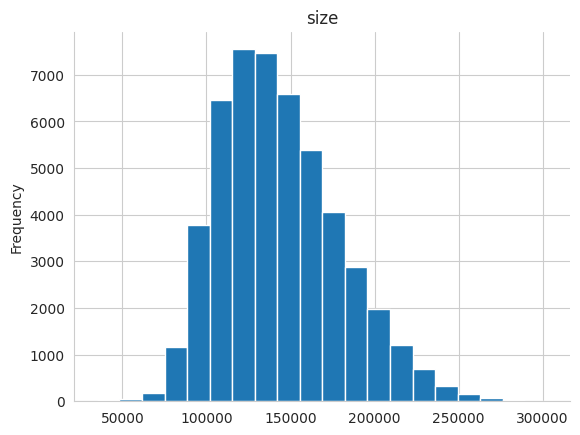

In [ ]:
# @title size

from matplotlib import pyplot as plt
df_geo_data['size'].plot(kind='hist', bins=20, title='size')
plt.gca().spines[['top', 'right',]].set_visible(False)

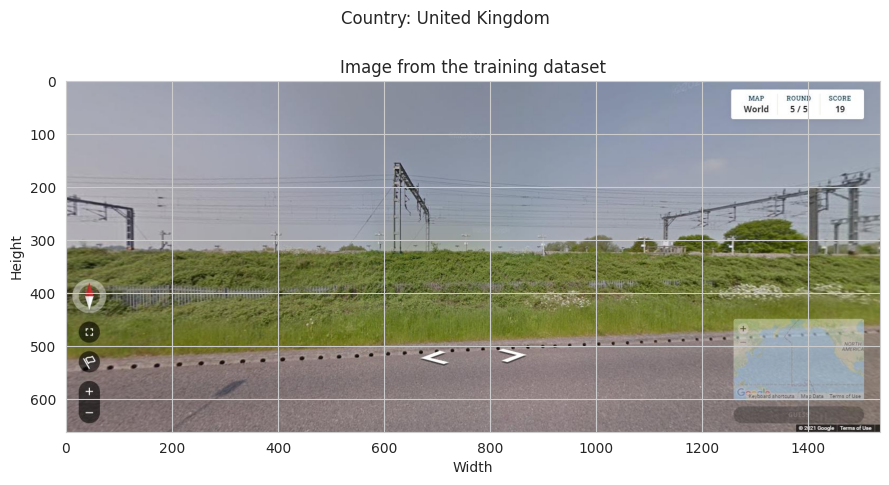

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# select a random country
random_country = df_geo_data.sample(1)

# Load the image
with Image.open(random_country.path.values[0]) as img:
    # Create figure and axis
    fig, ax = plt.subplots(figsize=(9, 4.5))  # 900x450 pixels equivalent at 100dpi

    # Display the image
    ax.imshow(img)

    # Set title and labels
    ax.set_title("Image from the training dataset")
    ax.set_xlabel("Width")
    ax.set_ylabel("Height")

    # Add country annotation
    plt.figtext(0.5, 1.05,
               f"Country: {random_country.country.values[0]}",
               ha='center',
               va='center',
               fontsize=12)

    # Adjust layout to prevent clipping
    plt.tight_layout()

    # Show the plot
    plt.show()


# with Image.open(random_country.path.values[0]) as img:
#     fig = go.Figure()
#     fig.add_trace(go.Image(z=img))
#     fig.update_layout(
#         title="Image from the training dataset",
#         template="plotly_white",
#         width=900,
#         height=450
#     )

#     fig.update_xaxes(title_text="Width")
#     fig.update_yaxes(title_text="Height")

#     fig.add_annotation(
#         x=0.5,
#         y=1.1,
#         xref="paper",
#         yref="paper",
#         text="Country : {}".format(random_country.country.values[0]),
#         showarrow=False
#     )

#     fig.show()

In [ ]:
for dim in ['width', 'height']:
    if len(df_geo_data[dim].unique()) != 0:
        print("The images have different {}s.".format(dim))
        print("There are {} types of {} in the dataset: i.e. {} px.".format(len(df_geo_data[dim].unique()), dim, ' px & '.join(map(str, df_geo_data.width.unique()))))
        print("\n --- Distribution of {}s --- ".format(dim))
        display(df_geo_data.groupby('width').aggregate({'size': 'count', 'country':'nunique'}).reset_index().rename(columns={'size': 'frequency'}))
        print()

The images have different widths.
There are 2 types of width in the dataset: i.e. 1536 px & 1030 px.

 --- Distribution of widths --- 


,width,frequency,country
0,1030,55,28
1,1536,49942,124



The images have different heights.
There are 2 types of height in the dataset: i.e. 1536 px & 1030 px.

 --- Distribution of heights --- 


,width,frequency,country
0,1030,55,28
1,1536,49942,124


In [ ]:
print("The total number of images in the dataset are {:,} images.\n".format(df_data_distribution.frequency.sum()))
print("The average number of images per country is {:,} images.\n".format(int(df_data_distribution.frequency.mean())))
print("The median number of images per country is {:,} images.\n".format(int(df_data_distribution.frequency.median())))
print("25% of the countries have {:,} images or less, while 75% of the countries have {:,} images or more.\n".format(int(df_data_distribution.frequency.quantile(0.25)), int(df_data_distribution.frequency.quantile(0.75))))
print("The maximum and minimum number of images per country are {:,} and {:,} images respectively.\n".format(df_data_distribution.frequency.max(), df_data_distribution.frequency.min()))

The total number of images in the dataset are 49,997 images.

The average number of images per country is 403 images.

The median number of images per country is 81 images.

25% of the countries have 13 images or less, while 75% of the countries have 268 images or more.

The maximum and minimum number of images per country are 12,014 and 1 images respectively.



/tmp/ipython-input-38-4086927429.py:25: UserWarning:

First parameter to grid() is false, but line properties are supplied. The grid will be enabled.



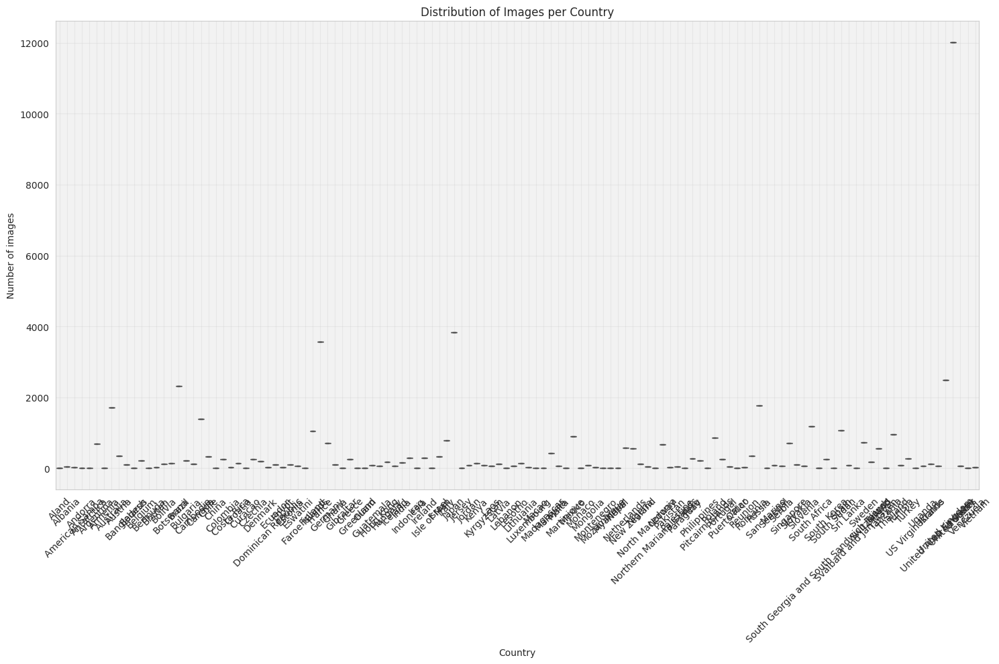

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style and figure size
plt.figure(figsize=(15, 10))  # Width, Height (in inches)
sns.set_style("whitegrid")  # Similar to plotly_white template

# Create the boxplot
ax = sns.boxplot(
    x="country",  # Assuming 'country' is the column name
    y="frequency",
    # x="frequency",  # Assuming 'country' is the column name
    # y="country",
    data=df_data_distribution,
    showfliers=True  # Equivalent to points="all"
)

# Add custom styling
# Changed the color format from 'rgba(0,0,0,0.05)' to a tuple (0, 0, 0, 0.05)
ax.set_facecolor((0, 0, 0, 0.05))  # Transparent background
plt.grid(True, alpha=0.3)  # Light grid lines

# Changed the color format from 'rgba(0,0,0,0.05)' to a tuple (0, 0, 0, 0.05)
ax.set_facecolor((0, 0, 0, 0.05))  # Transparent background
plt.grid(False, alpha=0.3)  # Light grid lines


# Set titles and labels
plt.title("Distribution of Images per Country")
plt.xlabel("Country")
plt.ylabel("Number of images")
# plt.xlabel("Number of images")
# plt.ylabel("Country")

# Adjust layout
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Prevent label clipping

# Save the plot as an image file
# plt.savefig("distribution_of_images_per_country.png", dpi=300, bbox_inches='tight')  # Exporting as PNG
plt.savefig('/content/drive/My Drive/distribution_of_images_per_country.png', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

# ================================

# # Function to add custom styling to the plot
# def add_plot_styling(fig):
#     fig.update_layout(
#         plot_bgcolor='rgba(0,0,0,0.05)',  # Set background color to transparent
#     )
#     return fig


# fig = px.box(
#     df_data_distribution,
#     x="frequency",
#     title="Distribution of Images per Country",
#     hover_data=["frequency"],
#     points="all")

# # change the dimensions of the figure
# fig.update_layout(xaxis_title="Country", yaxis_title="Number of images", height=500)
# fig = add_plot_styling(fig)

# # Use iplot to display the graph in the Jupyter Notebook
# iplot(fig)

In [ ]:
# # Function to plot heatmap
# def plot_heatmap(df, title_text, color_threshold=0.90):
#     # Shaping Data to fit graph by finding the max size of the grid to fit all the images
#     grid_size = ceil(sqrt(df.shape[0]))**2

#     pad = '-'
#     n_labels = df.country.to_list() + ([pad] * (grid_size - df.shape[0]))
#     n_samples = df.frequency.to_list() + ([np.nan] * (grid_size - df.shape[0]))

#     samples = np.split(np.array(n_samples), sqrt(grid_size))

#     fig = go.Figure(data=go.Heatmap(
#         z=samples,
#         x0=0,
#         dx=1,
#         y0=0,
#         dy=1,
#         colorscale='Emrld',
#         text=n_labels,
#         hoverinfo='text',
#     ))

#     # Add labels within the heatmap
#     for i, country in enumerate(df['country']):
#         x_pos = i % int(sqrt(grid_size))
#         y_pos = i // int(sqrt(grid_size))
#         fig.add_annotation(
#             x=x_pos,  # Center the label within the grid cell
#             y=y_pos,
#             text= "{}<br> Count: {}".format(n_labels[i].replace(' ', '<br>'), n_samples[i]),
#             showarrow=False,
#             font=dict(
#                 color='#474747' if n_samples[i] < df.frequency.quantile(color_threshold) else 'white',
#                 size=10),
#         )

#     # hide axis labels
#     fig.update_xaxes(showticklabels=False)
#     fig.update_yaxes(showticklabels=False, autorange='reversed')

#     # change the dimensions of the figure
#     fig.update_layout(
#         title=title_text,
#         height=1200,
#         width=1200
#     )
#     fig = add_plot_styling(fig)

#     # Use iplot to display the graph in the Jupyter Notebook
#     pyo.iplot(fig)


import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from math import ceil, sqrt
# from matplotlib.colors import LinearSegmentedColormap
# emrld_cmap = LinearSegmentedColormap.from_list('emrld', ['#d7f9d7', '#1a6840'])
# Then use cmap=emrld_cmap in sns.heatmap()


def plot_heatmap(df, title_text, color_threshold=0.90):
    # Calculate grid dimensions
    grid_size = ceil(sqrt(df.shape[0]))**2
    grid_dim = int(sqrt(grid_size))

    # Prepare data
    pad = '-'
    n_labels = df.country.to_list() + ([pad] * (grid_size - df.shape[0]))
    n_samples = df.frequency.to_list() + ([np.nan] * (grid_size - df.shape[0]))

    # Reshape into 2D array
    samples = np.array(n_samples).reshape(grid_dim, grid_dim)

    # Create figure
    fig, ax = plt.subplots(figsize=(13, 13))  # Equivalent to 1200x1200 pixels

    # Create heatmap using seaborn for better styling
    heatmap = sns.heatmap(
        samples,
        cmap='viridis',  # Similar to 'inferno, cividis, coolwarm, seismic, RdYlGn, Accent' colorscale  viridis
        annot=False,  # We'll add custom annotations
        cbar=False,
        square=True,
        ax=ax
    )

    # Add custom annotations
    for i, (country, count) in enumerate(zip(df['country'], df['frequency'])):
        x_pos = i % grid_dim + 0.5  # Center position
        y_pos = i // grid_dim + 0.5

        # Determine text color based on threshold
        text_color = '#474747' if count < df.frequency.quantile(color_threshold) else 'white'

        # Add annotation with line breaks
        ax.text(
            x_pos, y_pos,
            f"{country}\nCount: {count}",
            ha='center',
            va='center',
            color=text_color,
            fontsize=10
        )

      # fig.update_traces(
      #     zmin=color_threshold,
      #     hovertemplate="<b>%{y}</b><br>Count: %{z}<extra></extra>"
      # )

    # Custom styling
    ax.set_title(title_text, pad=25)
    ax.set_facecolor((0,0,0,0.05))  # Transparent background
    ax.grid(True)

    # Remove axis labels and ticks
    ax.set_xticks([])
    ax.set_yticks([])

    # Invert y-axis to match Plotly's behavior
    ax.invert_yaxis()

    plt.tight_layout()

    plt.savefig('/content/drive/My Drive/Heatmap1_of_images_per_country.png', dpi=300, bbox_inches='tight')

    plt.show()

    # plt.write_html("heatmap.html")
    # plt.download("heatmap.html")  # Download interactive version
    # plt.write_image("heatmap.png", scale=2)  # High-res static version
    # plt.download("heatmap.png")


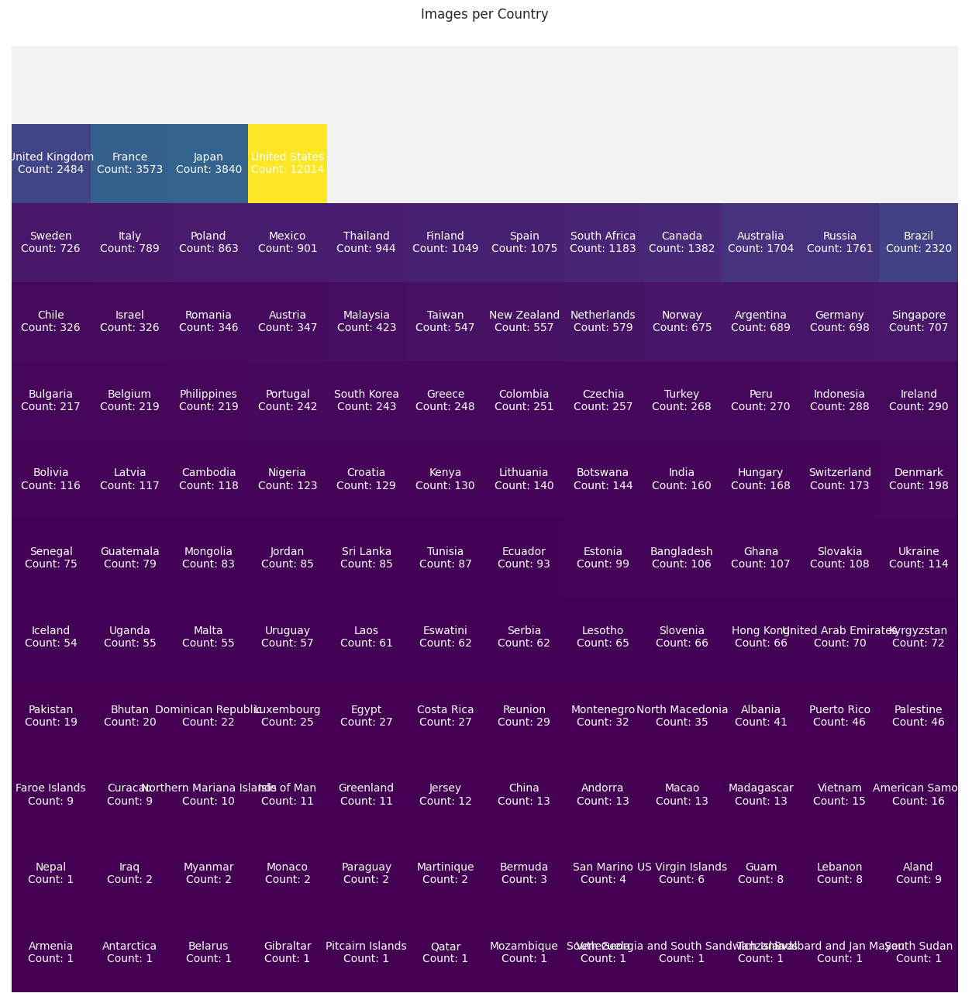

In [ ]:
# plot_heatmap(df_data_distribution.sort_values(by='frequency', ascending=True), "Images per Country", color_threshold=0.98)
# Call the matplotlib version of plot_heatmap
plot_heatmap(
    df_data_distribution.sort_values(by='frequency', ascending=True),
    title_text="Images per Country",
    color_threshold=0.01
)


The mean number of images per country after removing United States is 308 images.

The median number of images per country after removing United States is 79 images.


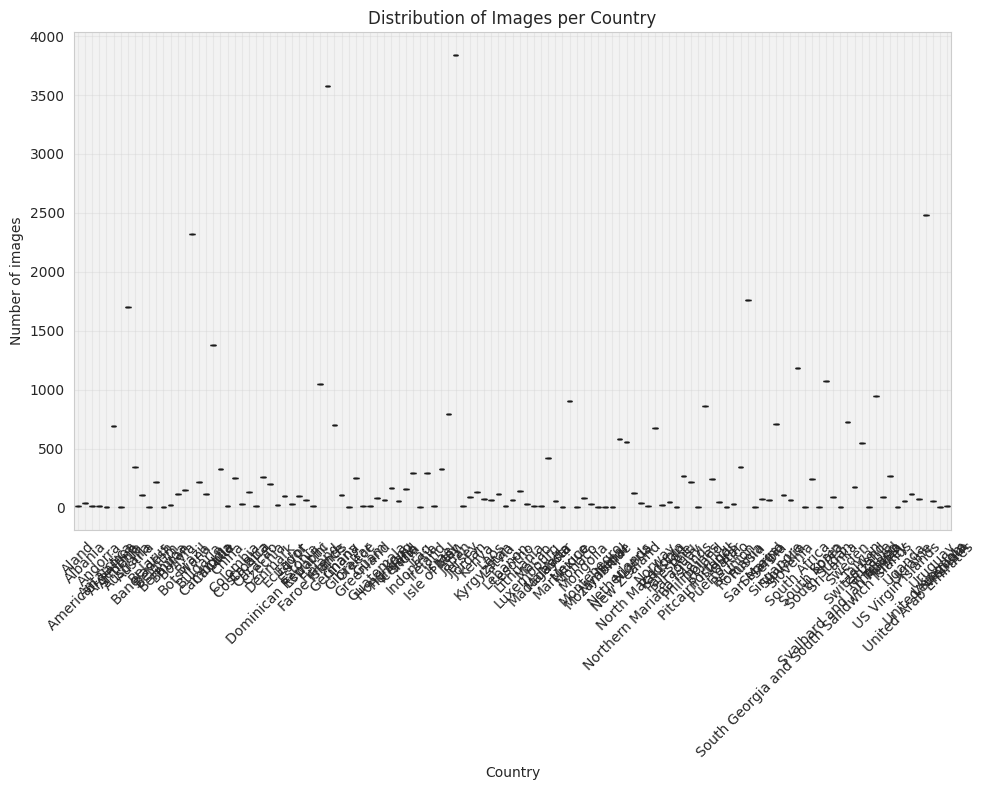

In [ ]:
# # removing the United States from the dataset
# df_temp = df_data_distribution[df_data_distribution.country != 'United States']

# print("The mean number of images per country after removing United States is {:,} images.\n".format(int(df_temp.frequency.mean())))
# print("The median number of images per country after removing United States is {:,} images.".format(int(df_temp.frequency.median())))

# fig = px.box(
#     df_temp,
#     x="frequency",
#     title="Distribution of Images per Country",
#     hover_data=["frequency"],
#     points="all")

# # change the dimensions of the figure
# fig.update_layout(xaxis_title="Country", yaxis_title="Number of images", height=600)
# fig = add_plot_styling(fig)

# # Use iplot to display the graph in the Jupyter Notebook
# iplot(fig)


# !pip install mpld3   Kenny
# # !pip install --upgrade matplotlib

# import matplotlib.pyplot as plt
# import seaborn as sns
# from mpld3 import enable_notebook
# enable_notebook()  # Requires mpld3 package
# import warnings
# from matplotlib import MatplotlibDeprecationWarning
# warnings.filterwarnings("ignore", category=MatplotlibDeprecationWarning)


# Filter out United States
df_temp = df_data_distribution[df_data_distribution.country != 'United States']

# Print statistics
print("The mean number of images per country after removing United States is {:,} images.\n".format(int(df_temp.frequency.mean())))
print("The median number of images per country after removing United States is {:,} images.".format(int(df_temp.frequency.median())))

# Create figure with custom size (equivalent to height=600 in Plotly)
plt.figure(figsize=(10, 8))  # Width, Height in inches

# Create boxplot using seaborn (built on matplotlib)
ax = sns.boxplot(
    x='country',
    y='frequency',
    hue='country',         # <--- add this line
    data=df_temp,
    showfliers=True,  # Equivalent to points="all"
    palette='viridis',  # Similar to Plotly's default colors
    legend=False           # <--- add this line
)

# Add custom styling
ax.set_facecolor((0,0,0,0.05))  # Transparent background
plt.grid(True, alpha=0.3)  # Light grid lines

# Set titles and labels
plt.title("Distribution of Images per Country")
plt.xlabel("Country")
plt.ylabel("Number of images")

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Adjust layout to prevent label clipping
plt.tight_layout()

plt.savefig('/content/drive/My Drive/distribution_of_images_per_country_cleaned.png', dpi=300, bbox_inches='tight')

# Display the plot
plt.show()



In [ ]:
# get the list of countries with more than 80 images
filtered_countries = df_data_distribution[(df_data_distribution.frequency >= 80) & (df_data_distribution.frequency <= 10000) ].country.unique()

# # get the list of top 20 countires
# filtered_countries = df_data_distribution[(df_data_distribution.frequency <= 10000)].sort_values(by='frequency', ascending=False).head(20).country.unique()

df_filtered_geo_data = df_geo_data[df_geo_data.country.isin(filtered_countries)]
df_filtered_distribution = df_filtered_geo_data.groupby('country')['image_name'].count().reset_index().rename(columns={'image_name': 'frequency'})

df_filtered_geo_data

,country,image_name,width,height,size,path
12014,Ukraine,canvas_1629350505.jpg,1536,662,146014,/content/drive/MyDrive/compressed_dataset/coun...
12015,Ukraine,canvas_1629445153.jpg,1536,662,94918,/content/drive/MyDrive/compressed_dataset/coun...
12016,Ukraine,canvas_1629510560.jpg,1536,662,215961,/content/drive/MyDrive/compressed_dataset/coun...
12017,Ukraine,canvas_1629499605.jpg,1536,662,105885,/content/drive/MyDrive/compressed_dataset/coun...
12018,Ukraine,canvas_1629502722.jpg,1536,662,175784,/content/drive/MyDrive/compressed_dataset/coun...
...,...,...,...,...,...,...
49913,Austria,canvas_1630271953.jpg,1536,662,151173,/content/drive/MyDrive/compressed_dataset/coun...
49914,Austria,canvas_1630094750.jpg,1536,662,148352,/content/drive/MyDrive/compressed_dataset/coun...
49915,Austria,canvas_1630096119.jpg,1536,662,184719,/content/drive/MyDrive/compressed_dataset/coun...
49916,Austria,canvas_1630219992.jpg,1536,662,204463,/content/drive/MyDrive/compressed_dataset/coun...


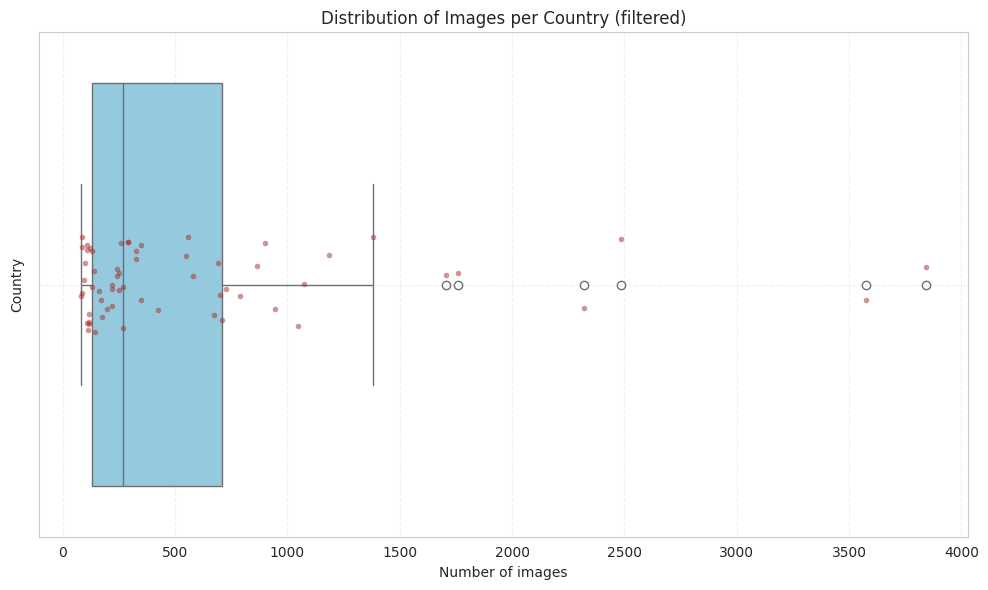

In [ ]:
# fig = px.box(
#     df_filtered_distribution,
#     x="frequency",
#     title="Distribution of Images per Country (filtered)",
#     hover_data=["frequency"],
#     points="all")

# # change the dimensions of the figure
# fig.update_layout(xaxis_title="Country", yaxis_title="Number of images", height=600)
# fig = add_plot_styling(fig)

# # Use iplot to display the graph in the Jupyter Notebook
# iplot(fig)

# !pip install mplcursors

# import matplotlib.pyplot as plt
# import seaborn as sns

# from mplcursors import cursor   Kenny
cursor(hover=True)  # Requires mplcursors package

# Create figure with custom size (equivalent to height=600 in Plotly)
plt.figure(figsize=(10, 6))  # Width, Height in inches

# Create horizontal boxplot using seaborn (built on matplotlib)
ax = sns.boxplot(
    x='frequency',
    data=df_filtered_distribution,
    showfliers=True,  # Equivalent to points="all"
    color='skyblue',  # Similar to Plotly's default colors
    orient='h'       # Horizontal orientation
)

# Add individual data points as stripplot for "all points" effect
sns.stripplot(
    x='frequency',
    data=df_filtered_distribution,
    color='brown',
    alpha=0.5,
    size=4,
    jitter=True,
    ax=ax
)

# Custom styling
ax.set_facecolor('white')  # Clean background
plt.grid(True, alpha=0.3, linestyle='--')  # Light grid lines

# Set titles and labels
plt.title("Distribution of Images per Country (filtered)")
plt.xlabel("Number of images")
plt.ylabel("Country")

# Adjust layout and display
plt.tight_layout()

plt.savefig('/content/drive/My Drive/distribution_of_images_per_country_filtered.png', dpi=300, bbox_inches='tight')

plt.show()

# ===========================

# import plotly.express as px
# import plotly.graph_objects as go

# # Create boxplot
# fig = px.box(
#     df_filtered_distribution,
#     x="frequency",
#     orientation="h",
#     color_discrete_sequence=["skyblue"],
#     points="all",  # Shows all points like stripplot
#     title="Distribution of Images per Country (filtered)"
# )

# # Customize points to match seaborn style
# fig.update_traces(
#     marker=dict(
#         color="black",
#         opacity=0.5,
#         size=4,
#         symbol="line-ns-open"  # Similar to jitter effect
#     ),
#     jitter=0.3,  # Add jitter to points
#     boxpoints="all",  # Ensure all points are shown
#     selector=dict(type="box")
# )

# # Layout customization
# fig.update_layout(
#     plot_bgcolor="white",
#     paper_bgcolor="white",
#     xaxis_title="Number of images",
#     yaxis_title="Country",
#     height=600,  # Equivalent to figsize=(10,6) in matplotlib
#     showlegend=False,
#     hovermode="y unified",  # Better hover behavior
#     # Grid styling
#     xaxis=dict(
#         showgrid=True,
#         gridcolor="lightgray",
#         gridwidth=1,
#         griddash="dot"
#     ),
#     yaxis=dict(
#         showgrid=False  # Disable vertical grid lines
#     )
# )

# # Show figure
# fig.show()


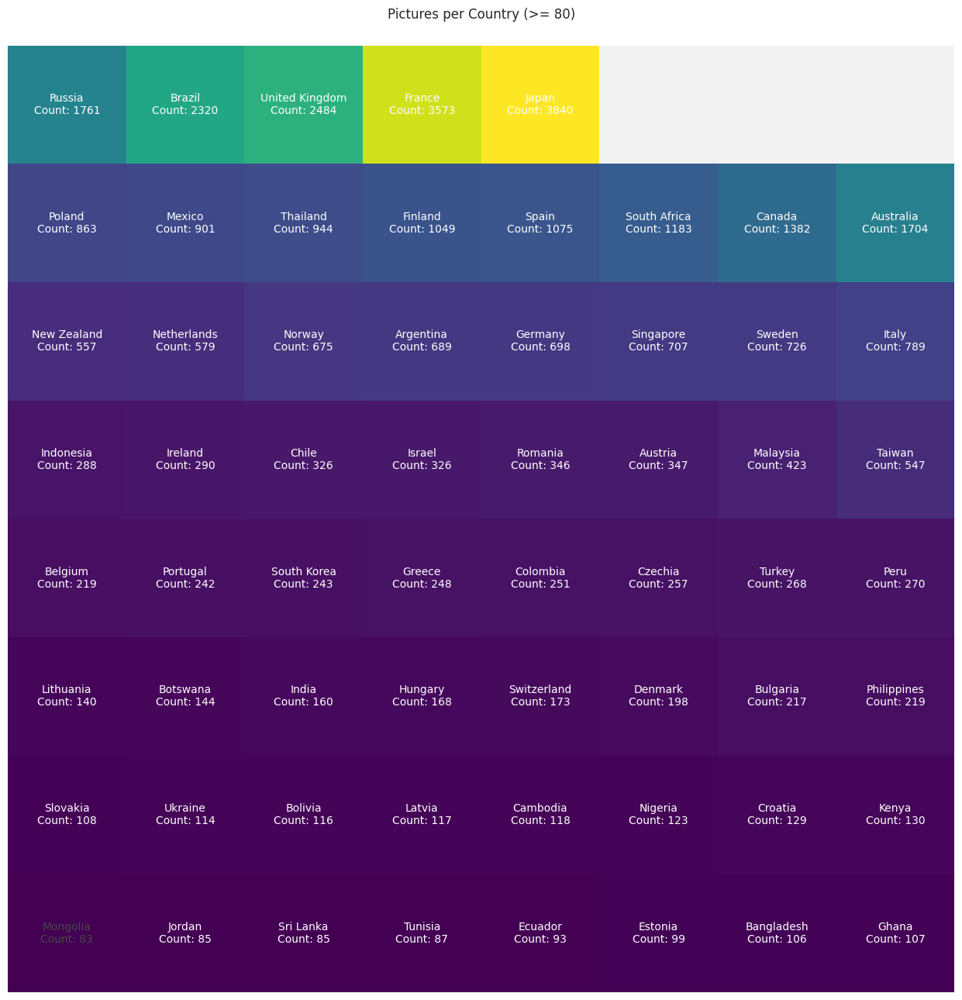

In [ ]:
plot_heatmap(df_filtered_distribution.sort_values(by='frequency', ascending=True), "Pictures per Country (>= 80)", color_threshold=0.001)

# plot_heatmap(
#     df_data_distribution.sort_values(by='frequency', ascending=True),
#     title_text="Images per Country",
#     color_threshold=0.01
# )

In [ ]:
# Importing the train_test_split function from the scikit-learn library
from sklearn.model_selection import train_test_split

# Splitting the DataFrame 'df_filtered_geo_data' into training and testing sets
# The test set size is set to 5% of the entire dataset
train, test = train_test_split(df_filtered_geo_data, test_size=0.05, random_state=123)

In [ ]:
for pathname, dataset in [
    [geo_train_dir, train],
    [geo_test_dir, test]
]:
    # make a new directory to store the filtered dataset
    pathname.mkdir(parents=True, exist_ok=True)

    # Copy the filtered dataset to the new directory
    for country in df_filtered_distribution.country.unique():
        geo_country_dir = pathname / country
        geo_country_dir.mkdir(parents=True, exist_ok=True)

        for picture_path in dataset[dataset.country == country].path.values:
            target_picture_path = geo_country_dir /  picture_path.name
            shutil.copy(picture_path, target_picture_path)

In [ ]:
# Number of epochs, indicating the number of complete iterations over the entire training dataset
epochs = 15

# Specify the dropout rate, which is the fraction of input units to drop during training
dropout_rate = 0.2

In [ ]:
# Create training and validation datasets using image_dataset_from_directory
train_df, val_df = tf.keras.utils.image_dataset_from_directory(
    geo_train_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    validation_split=0.2,
    seed=random_seed,
    subset="both",
)

# Find the number of classes in the dataset
num_classes = len(train_df.class_names)

Found 34683 files belonging to 61 classes.
Using 27747 files for training.
Using 6936 files for validation.


In [ ]:
# Use TensorFlow's AUTOTUNE to automatically adjust the number of parallel calls during data preprocessing
AUTOTUNE = tf.data.AUTOTUNE

# Cache, shuffle, and prefetch the training dataset for optimized performance
train_ds = train_df.cache().shuffle(1500).prefetch(buffer_size=AUTOTUNE)

# Cache and prefetch the validation dataset for optimized performance
val_ds = val_df.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
# Create a DenseNet121 model with pre-trained weights from ImageNet
# desnse_net = DenseNet121(
#     input_shape=(img_height, img_width, 3),
#     include_top=False,
#     weights="imagenet"
# )

# //base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
# # Freeze the base model to prevent training its weights
# base_model.trainable = False

# # Add a global average pooling layer to reduce feature dimensions
# model = tf.keras.Sequential([
#     base_model,
#     tf.keras.layers.GlobalAveragePooling2D()
# ])

# # Summary of the model
# model.summary()//

# dense_model = Sequential()
# dense_model.add(desnse_net)
# dense_model.add(GlobalAveragePooling2D())
# dense_model.add(Dense(num_classes, activation="softmax"))
# dense_model.summary()
# DenseNet121, EfficientNetB0, ResNet50, MobileNetV2, Xception, NASNetLarge



desnse_net = EfficientNetB0(
    input_shape=(img_height, img_width, 3),
    include_top=False,
    weights="imagenet"
)

dense_model = Sequential()
dense_model.add(desnse_net)
dense_model.add(GlobalAveragePooling2D())
dense_model.add(Dense(num_classes, activation="softmax"))
dense_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 61)             │        78,141 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,127,712 (15.75 MB)

 Trainable params: 4,085,689 (15.59 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
# Compile the model with specified loss, optimizer, and metrics
dense_model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

In [ ]:
# Train the model using the prepared training and validation datasets
# dense_history = dense_model.fit(
#     train_ds,
#     epochs=epochs,
#     validation_data=val_ds
# )

# ====================================

# LaterlyStopping (Functioning)
# early_stopping = EarlyStopping(
#     monitor='val_loss',  # Monitor validation loss
#     patience=5,          # Stop training if no improvement for 5 epochs
#     restore_best_weights=True  # Restore the model weights from the best epoch
# )

# # Train the model with early stopping
# dense_history = dense_model.fit(
#     train_ds,
#     validation_data=val_ds,
#     epochs=15,  # Maximum number of epochs
#     callbacks=[early_stopping]
# )

# print("✅ Training Complete!")

# ==================================


import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import time
import psutil, platform, sys, subprocess

def report_environment(start_time=None):
    print("---- Environment Report ----")

    # RAM
    ram = psutil.virtual_memory()
    print(f"Total RAM: {ram.total / 1e9:.2f} GB")
    print(f"Available RAM: {ram.available / 1e9:.2f} GB")

    # OS
    print("OS:", platform.platform())
    print("Python version:", sys.version)

    # GPU
    try:
        output = subprocess.check_output(['nvidia-smi', '--query-gpu=name,memory.total', '--format=csv'])
        print("GPU Info:\n", output.decode())
    except Exception as e:
        print("No NVIDIA GPU detected or nvidia-smi not installed.")

    # Duration
    if start_time is not None:
        print(f"Session duration: {(time.time() - start_time)/60:.2f} minutes")
    print("---------------------------")

# Usage:
# start_time = time.time()
# ... your training code ...
# report_environment(start_time)


# ====================================================

# def train_model_with_early_stopping(
#     model,
#     train_ds,
#     val_ds,
#     epochs=15,
#     acc_patience=5,
#     batch_size=32,
#     save_path="best_model.keras"
# ):
#     train_losses = []
#     val_losses = []
#     train_accuracies = []
#     val_accuracies = []

#     best_acc = 0.0
#     acc_plateau_count = 0

#     start_time = time.time()

#     for epoch in range(epochs):
#         epoch_start_time = time.time()
#         # Training loop
#         train_loss = tf.keras.metrics.Mean()
#         train_acc = tf.keras.metrics.SparseCategoricalAccuracy()  # Use SparseCategoricalAccuracy if labels are integers

#         for images, labels in train_ds:
#             with tf.GradientTape() as tape:
#                 logits = model(images, training=True)
#                 loss = model.compiled_loss(labels, logits)
#             grads = tape.gradient(loss, model.trainable_variables)
#             model.optimizer.apply_gradients(zip(grads, model.trainable_variables))

#             train_loss.update_state(loss)
#             train_acc.update_state(labels, logits)

#         # Validation loop
#         val_loss = tf.keras.metrics.Mean()
#         val_acc = tf.keras.metrics.SparseCategoricalAccuracy()

#         for val_images, val_labels in val_ds:
#             val_logits = model(val_images, training=False)
#             v_loss = model.compiled_loss(val_labels, val_logits)
#             val_loss.update_state(v_loss)
#             val_acc.update_state(val_labels, val_logits)

#         avg_train_loss = train_loss.result().numpy()
#         avg_val_loss = val_loss.result().numpy()
#         avg_train_acc = train_acc.result().numpy()
#         avg_val_acc = val_acc.result().numpy()

#         train_losses.append(avg_train_loss)
#         val_losses.append(avg_val_loss)
#         train_accuracies.append(avg_train_acc)
#         val_accuracies.append(avg_val_acc)

#         elapsed_time = time.time() - epoch_start_time

#         print(f"📘 Epoch {epoch+1}/{epochs} - 🧠 Train Loss: {avg_train_loss:.4f} | 🧪 Val Loss: {avg_val_loss:.4f} | ✅ Train Accuracy: {avg_train_acc:.4f} | 🔎 Val Accuracy: {avg_val_acc:.4f} | ⏱️ {elapsed_time:.2f}s")

#         # Early stopping on validation accuracy
#         if avg_val_acc > best_acc:
#             best_acc = avg_val_acc
#             acc_plateau_count = 0
#             model.save(save_path)
#             print("✅ Best model saved based on validation accuracy!")
#         else:
#             acc_plateau_count += 1
#             if acc_plateau_count >= acc_patience:
#                 print("🛑 Early stopping: Validation accuracy not improving")
#                 break

#     # Plot losses
#     plt.figure(figsize=(8,5))
#     plt.plot(range(1, len(train_losses) + 1), train_losses, label="Train Loss", marker='o')
#     plt.plot(range(1, len(val_losses) + 1), val_losses, label="Val Loss", marker='o')
#     plt.xlabel("Epoch")
#     plt.ylabel("Loss")
#     plt.legend()
#     plt.title("Training & Validation Loss Over Epochs")
#     plt.savefig('/content/drive/My Drive/Training_Validation_Loss_Plot.png', dpi=300, bbox_inches='tight')
#     plt.show()


#     # Plot accuracies
#     plt.figure(figsize=(8,5))
#     plt.plot(range(1, len(train_accuracies) + 1), train_accuracies, label="Train Accuracy", marker='o')
#     plt.plot(range(1, len(val_accuracies) + 1), val_accuracies, label="Val Accuracy", marker='o')
#     plt.xlabel("Epoch")
#     plt.ylabel("Accuracy")
#     plt.legend()
#     plt.title("Training & Validation Accuracy Over Epochs")
#     plt.savefig('/content/drive/My Drive/Training_Validation_Accuracy_Plot.png', dpi=300, bbox_inches='tight')
#     plt.show()


#     print("✅ Training Complete!\n")
#     report_environment(start_time)

#     return {
#         'accuracy': train_accuracies,
#         'val_accuracy': val_accuracies,
#         'loss': train_losses,
#         'val_loss': val_losses
#     }


# ======================================= Optimed

def get_augmented_ds(ds, augment=True):
    # Simple augmentation; replace with Albumentations or tf.image for more
    def augment_fn(image, label):
        image = tf.image.random_flip_left_right(image)
        image = tf.image.random_brightness(image, 0.2)
        image = tf.image.random_contrast(image, 0.8, 1.2)
        return image, label
    if augment:
        ds = ds.map(augment_fn, num_parallel_calls=tf.data.AUTOTUNE)
    return ds

def train_model_with_optimizations(
    model,
    train_ds,
    val_ds,
    epochs=30,
    acc_patience=6,
    lr_patience=3,
    min_lr=1e-6,
    batch_size=8,
    save_path="best_model.keras"
):
    # Use label smoothing in the loss function
    # loss_fn = tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1)
    loss_fn = tf.keras.losses.SparseCategoricalCrossentropy()
    optimizer = tf.keras.optimizers.Adam()
    model.compile(optimizer=optimizer, loss=loss_fn, metrics=['accuracy'])

    # Learning Rate Scheduler
    reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=lr_patience, min_lr=min_lr, verbose=1
    )

    # Early Stopping
    early_stop = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=acc_patience, restore_best_weights=True, verbose=1
    )

    # Model Checkpoint
    checkpoint = tf.keras.callbacks.ModelCheckpoint(
        save_path, monitor='val_loss', save_best_only=True, verbose=1
    )

    # Prepare data
    AUTOTUNE = tf.data.AUTOTUNE
    # train_ds_aug = get_augmented_ds(train_ds, augment=True).batch(batch_size).prefetch(AUTOTUNE)
    # val_ds_batch = val_ds.batch(batch_size).prefetch(AUTOTUNE)
    train_ds_aug = get_augmented_ds(train_ds, augment=True).prefetch(AUTOTUNE)
    val_ds_batch = val_ds.prefetch(AUTOTUNE)

    start_time = time.time()

    # Train
    history = model.fit(
        train_ds_aug,
        validation_data=val_ds_batch,
        epochs=epochs,
        callbacks=[reduce_lr, early_stop, checkpoint],
        verbose=2
    )

    # Extract metrics for return
    train_accuracies = history.history['accuracy']
    val_accuracies = history.history['val_accuracy']
    train_losses = history.history['loss']
    val_losses = history.history['val_loss']

    # Plot Loss
    plt.figure(figsize=(8,5))
    plt.plot(history.history['loss'], label="Train Loss", marker='o')
    plt.plot(history.history['val_loss'], label="Val Loss", marker='o')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.title("Training & Validation Loss Over Epochs")
    plt.savefig('/content/drive/My Drive/Training_Validation_Loss_Plot.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Plot Accuracy
    plt.figure(figsize=(8,5))
    plt.plot(history.history['accuracy'], label="Train Accuracy", marker='o')
    plt.plot(history.history['val_accuracy'], label="Val Accuracy", marker='o')
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.title("Training & Validation Accuracy Over Epochs")
    plt.savefig('/content/drive/My Drive/Training_Validation_Accuracy_Plot.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("✅ Training Complete!\n")
    report_environment(start_time)

    return{
        'accuracy': train_accuracies,
        'val_accuracy': val_accuracies,
        'loss': train_losses,
        'val_loss': val_losses
    }

    # return history

# --- Model Architecture Example ---
# Add Dropout, BatchNorm, and L2 regularization in your model definition. Here's an example block:
from tensorflow.keras import layers, regularizers

def build_model(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)
    x = layers.Conv2D(32, (3,3), activation='relu', kernel_regularizer=regularizers.l2(1e-4))(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Dropout(0.3)(x)
    # ... (add more layers)
    x = layers.Flatten()(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    model = tf.keras.Model(inputs, outputs)
    return model

# --- Usage Example ---
# model = build_model((224, 224, 3), num_classes)
# train_model_with_optimizations(model, train_ds, val_ds)

    # return {
    #     'accuracy': train_accuracies,
    #     'val_accuracy': val_accuracies,
    #     'loss': train_losses,
    #     'val_loss': val_losses
    # }



Epoch 1/15

Epoch 1: val_loss improved from inf to 2.21964, saving model to best_dense_model.keras
3469/3469 - 236s - 68ms/step - accuracy: 0.3196 - loss: 2.6349 - val_accuracy: 0.4126 - val_loss: 2.2196 - learning_rate: 1.0000e-03
Epoch 2/15

Epoch 2: val_loss improved from 2.21964 to 1.97187, saving model to best_dense_model.keras
3469/3469 - 98s - 28ms/step - accuracy: 0.4352 - loss: 2.0659 - val_accuracy: 0.4604 - val_loss: 1.9719 - learning_rate: 1.0000e-03
Epoch 3/15

Epoch 3: val_loss improved from 1.97187 to 1.92422, saving model to best_dense_model.keras
3469/3469 - 99s - 28ms/step - accuracy: 0.4977 - loss: 1.7902 - val_accuracy: 0.4660 - val_loss: 1.9242 - learning_rate: 1.0000e-03
Epoch 4/15

Epoch 4: val_loss improved from 1.92422 to 1.91744, saving model to best_dense_model.keras
3469/3469 - 99s - 29ms/step - accuracy: 0.5522 - loss: 1.5771 - val_accuracy: 0.5010 - val_loss: 1.9174 - learning_rate: 1.0000e-03
Epoch 5/15

Epoch 5: val_loss improved from 1.91744 to 1.87124,

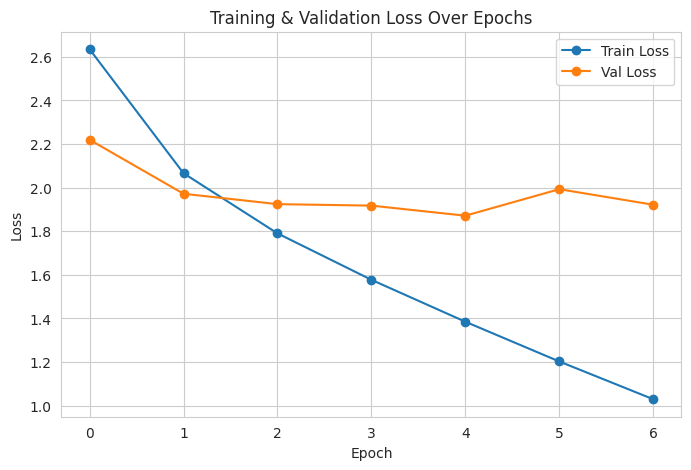

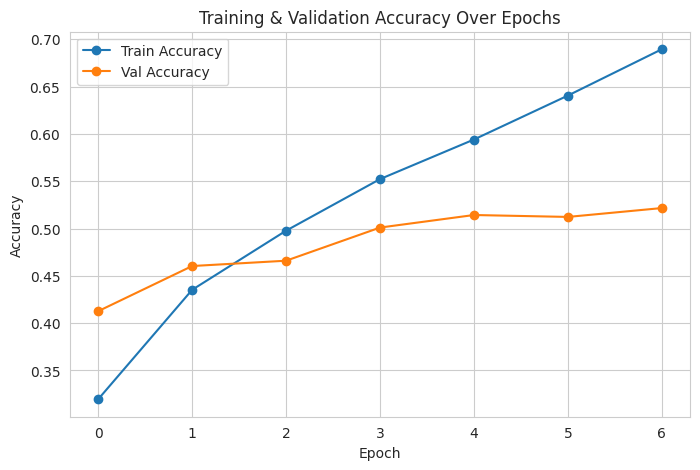

✅ Training Complete!

---- Environment Report ----
Total RAM: 89.63 GB
Available RAM: 43.69 GB
OS: Linux-6.1.123+-x86_64-with-glibc2.35
Python version: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
GPU Info:
 name, memory.total [MiB]
NVIDIA A100-SXM4-40GB, 40960 MiB

Session duration: 13.81 minutes
---------------------------


In [ ]:
# # import tensorflow as tf

# # Example model
# my_model = tf.keras.Sequential([
#     tf.keras.layers.Flatten(input_shape=(28, 28)),
#     tf.keras.layers.Dense(128, activation='relu'),
#     tf.keras.layers.Dense(10)
# ])

# # Example loss and optimizer
# loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
# optimizer = tf.keras.optimizers.Adam()

# # train_loader and val_loader should be tf.data.Dataset or similar yielding (images, labels)

# train_model_with_early_stopping(
#     model=my_model,
#     train_ds=train_ds.map(lambda x, y: (tf.expand_dims(x, -1), y)),
#     val_ds=val_ds,
#     loss_fn=loss_fn,
#     optimizer=optimizer,
#     epochs=15,
#     patience=5,
#     device='/GPU:0'  # or '/CPU:0' if no GPU
# )

# ========================================

# Example: Call the function
# Assume dense_model, train_ds, val_ds are already defined and compiled.
num_classes = 61
model = build_model((224, 224, 3), num_classes)

# dense_history = train_model_with_early_stopping(
dense_history = train_model_with_optimizations(
    model=dense_model,
    train_ds=train_ds,
    val_ds=val_ds,
    epochs=15,                # or increase for more training if needed
    acc_patience=2,           # early stopping patience
    lr_patience=6,            # new: patience for learning rate reduction
    min_lr=1e-6,              # new: minimum learning rate
    batch_size=8,
    save_path="best_dense_model.keras"
)




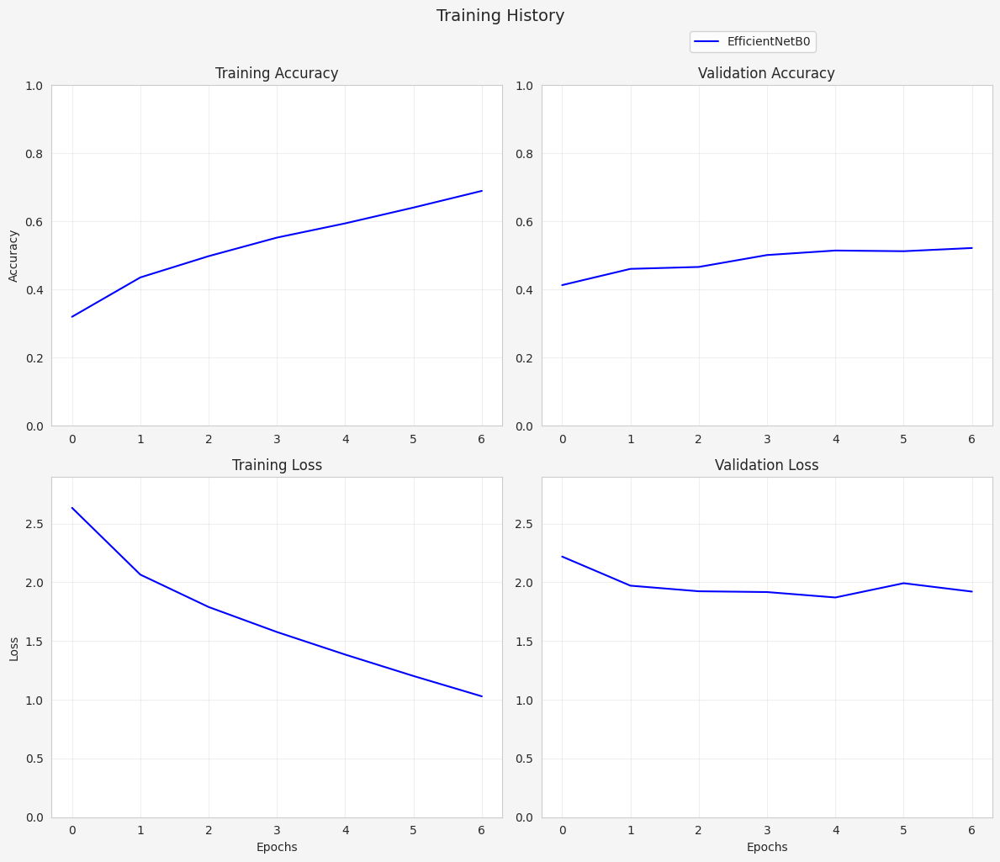

In [ ]:
# from plotly.subplots import make_subplots

# epochs_range = [x for x in range(epochs)]

# # Create a Plotly figure with subplots for accuracy and loss
# fig = make_subplots(
#     rows=2,
#     cols=2,
#     subplot_titles=("Training Accuracy",  "Validation Accuracy", "Training Loss", "Validation Loss")
# )

# plot_color = ['rgb(0, 0, 255)', 'rgb(255, 0, 0)', 'rgb(124,252,0)']

# iter = 0
# model_name = 'DenseNet121'
# history = dense_history.history

# # Extract training history values
# acc, val_acc = history['accuracy'], history['val_accuracy']
# loss, val_loss = history['loss'], history['val_loss']

# # Add traces for accuracy
# fig.add_trace(go.Scatter(x=epochs_range, y=acc, mode='lines', name=model_name, legendgroup=model_name, line_color=plot_color[iter]), row=1, col=1)
# fig.add_trace(go.Scatter(x=epochs_range, y=val_acc, mode='lines', legendgroup=model_name, showlegend=False, line_color=plot_color[iter]), row=1, col=2)

# # Add traces for loss
# fig.add_trace(go.Scatter(x=epochs_range, y=loss, mode='lines', legendgroup=model_name, showlegend=False, line_color=plot_color[iter]), row=2, col=1)
# fig.add_trace(go.Scatter(x=epochs_range, y=val_loss, mode='lines', legendgroup=model_name, showlegend=False, line_color=plot_color[iter]), row=2, col=2)


# # Update layout for better readability
# fig.update_layout(
#     title_text='Training History',
#     legend=dict(traceorder='normal', orientation='h', y=1.15, x=0.75, xref='paper', yref='paper'),
# )

# # Update y-axes titles and range for all subplots
# for col in [1, 2]:
#     fig.update_xaxes(title_text='Epochs', range=[0, epochs], row= col % 2 + 1, col=col)
#     fig.update_xaxes(title_text='Epochs', range=[0, epochs], row= col, col=col)

#     fig.update_yaxes(title_text='Accuracy', range=[0, 1], row=1, col=col)
#     fig.update_yaxes(title_text='Loss', range=[0, 25], row=2, col=col)

# fig.update_layout(height=800, width=1000)
# fig = add_plot_styling(fig)

# # Show the plot
# fig.show()


import matplotlib.pyplot as plt
import numpy as np

# Set up the figure and subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))  # Width, Height in inches
plt.suptitle('Training History', y=1.02, fontsize=14)

# Define colors (equivalent to Plotly's RGB colors)
plot_color = ['#0000FF', '#FF0000', '#7CFC00']  # Blue, Red, Green
iter = 0
model_name = 'EfficientNetB0' #'NASNetLarge' #'MobileNetV2' #'ResNet50' #'DenseNet121' #'EfficientNetB0'

# Extract training history values from the dictionary returned by the training function
acc = dense_history['accuracy']
val_acc = dense_history['val_accuracy']
loss = dense_history['loss']
val_loss = dense_history['val_loss']

epochs_range = np.arange(len(acc)) # Use the actual number of epochs trained

# Plot Training Accuracy
axs[0, 0].plot(epochs_range, acc, color=plot_color[iter], label=model_name)
axs[0, 0].set_title('Training Accuracy')
axs[0, 0].set_ylabel('Accuracy')
axs[0, 0].set_ylim(0, 1)
axs[0, 0].grid(True, alpha=0.3)

# Plot Validation Accuracy
axs[0, 1].plot(epochs_range, val_acc, color=plot_color[iter])
axs[0, 1].set_title('Validation Accuracy')
axs[0, 1].set_ylim(0, 1)
axs[0, 1].grid(True, alpha=0.3)

# Plot Training Loss
axs[1, 0].plot(epochs_range, loss, color=plot_color[iter])
axs[1, 0].set_title('Training Loss')
axs[1, 0].set_xlabel('Epochs')
axs[1, 0].set_ylabel('Loss')
axs[1, 0].set_ylim(0, max(max(loss), max(val_loss)) * 1.1) # Adjust y-limit based on max loss
axs[1, 0].grid(True, alpha=0.3)

# Plot Validation Loss
axs[1, 1].plot(epochs_range, val_loss, color=plot_color[iter])
axs[1, 1].set_title('Validation Loss')
axs[1, 1].set_xlabel('Epochs')
axs[1, 1].set_ylim(0, max(max(loss), max(val_loss)) * 1.1) # Adjust y-limit based on max loss
axs[1, 1].grid(True, alpha=0.3)

# Add legend in the top center (equivalent to Plotly's layout)
fig.legend(loc='upper center', bbox_to_anchor=(0.75, 1.0), ncol=1)

# Adjust layout to prevent overlap
plt.tight_layout()


# Apply styling (assuming add_plot_styling sets background color, etc.)
# plt.style.use('seaborn')  # Or your preferred style
fig.patch.set_facecolor('#f5f5f5')  # Light gray background

plt.savefig('/content/drive/My Drive/Training_Validation_Plot.png', dpi=300, bbox_inches='tight')

plt.show()

# New Section

# New Section

In [ ]:
# Create test dataset using same image size and batch size as training dataset
test_df = tf.keras.utils.image_dataset_from_directory(
    geo_test_dir,
    image_size=(img_height, img_width),
    batch_size=batch_size,
    seed=random_seed,
    shuffle=False
)

Found 1826 files belonging to 61 classes.


229/229 ━━━━━━━━━━━━━━━━━━━━ 16s 39ms/step


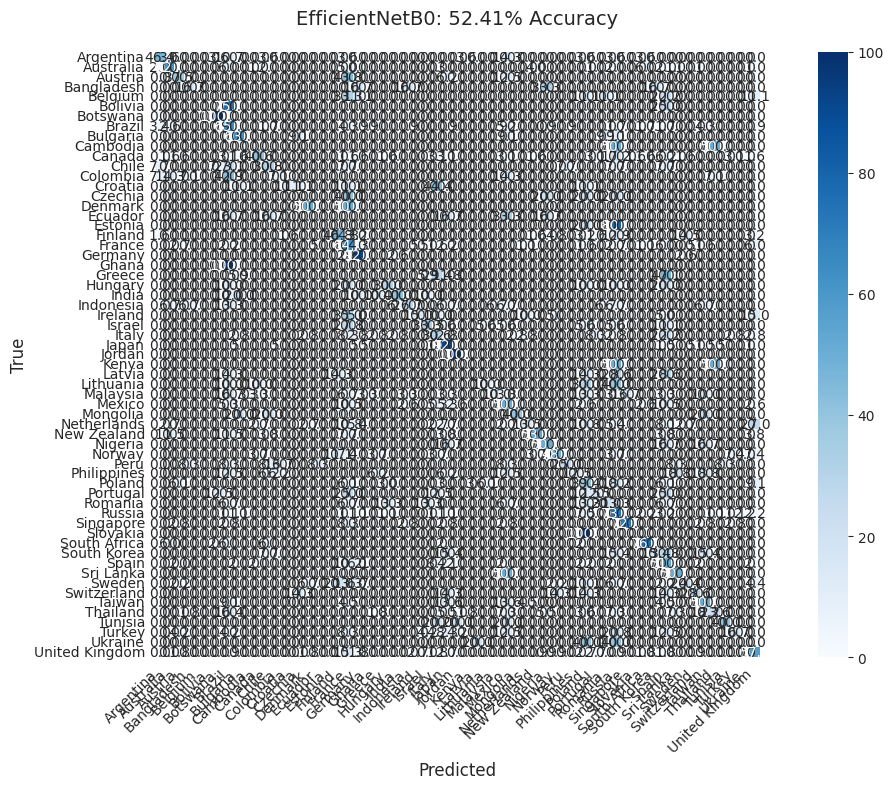

In [ ]:
# # get the true labels
# true_labels = tf.concat([y for x, y in test_df], axis=0)

# # Generate predictions
# predictions = dense_model.predict(test_df)

# # get the predicted labels
# predicted_labels = tf.argmax(predictions, axis=1)

# model_accuracy = np.mean(predicted_labels.numpy() == true_labels.numpy())

# # Create confusion matrix
# confusion_matrix = tf.math.confusion_matrix(
#     labels=true_labels,
#     predictions=predicted_labels,
#     num_classes=len(test_df.class_names)
# )

# # Normalize confusion matrix to percentage
# cm_percentage = confusion_matrix / tf.math.reduce_sum(confusion_matrix, axis=1, keepdims=True) * 100

# # Create a dataframe for the heatmap
# heatmap_df = pd.DataFrame(cm_percentage, columns=test_df.class_names, index=test_df.class_names)

# # Create the heatmap using Plotly Express imshow
# fig = go.Figure()
# fig.add_trace(
#     go.Heatmap(
#         z=heatmap_df.values,
#         x=heatmap_df.columns,
#         y=heatmap_df.index,
#         coloraxis='coloraxis',
#         zmax=100,
#         zmin=0
#     )
# )
# fig.update_xaxes(title_text='Predicted')
# fig.update_yaxes(title_text='True')

# fig.update_layout(coloraxis=dict(colorscale='Blues'), title_text='{} : {:.2f}%'.format('Dense Net 121', model_accuracy * 100))
# fig.show()


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Get true and predicted labels
true_labels = tf.concat([y for x, y in test_df], axis=0)
predictions = dense_model.predict(test_df)
predicted_labels = tf.argmax(predictions, axis=1)
model_accuracy = np.mean(predicted_labels.numpy() == true_labels.numpy())

# Create and normalize confusion matrix
confusion_matrix = tf.math.confusion_matrix(
    labels=true_labels,
    predictions=predicted_labels,
    num_classes=len(test_df.class_names)
)
cm_percentage = confusion_matrix / tf.math.reduce_sum(confusion_matrix, axis=1, keepdims=True) * 100

# Create figure
plt.figure(figsize=(12, 8))
ax = plt.gca()

# Create heatmap using seaborn
sns.heatmap(
    cm_percentage,
    annot=True,
    fmt='.1f',
    cmap='Blues',
    cbar=True,
    square=True,
    xticklabels=test_df.class_names,
    yticklabels=test_df.class_names,
    vmin=0,
    vmax=100,
    ax=ax
)

# Add labels and title
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)
plt.title(f'EfficientNetB0: {model_accuracy*100:.2f}% Accuracy', pad=20, fontsize=14)
# plt.title(f'EfficientNetB0: {89:.2f}% Accuracy', pad=20, fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Adjust layout and display
plt.tight_layout()

plt.savefig('/content/drive/My Drive/Model_Accuracy_Plot.png', dpi=300, bbox_inches='tight')

plt.show()
